# Test Otsu thresholding on water image

The global water watch algorithm uses [Otsu thresholding](http://www.labbookpages.co.uk/software/imgProc/otsuThreshold.html) to determine the MNDWI threshold between water and land. We can implement this using local xarray implementation, which can then be passed to chunks as a [UDF](https://open-eo.github.io/openeo-python-client/udf.html) in the openeo backend.

In [1]:
# imports
from typing import List, Dict, Tuple, Union
from pathlib import Path

import geojson
from openeo import connect, Connection
from openeo.rest.datacube import DataCube
from pyproj import CRS, Transformer
from shapely.geometry import MultiPolygon, Polygon
from shapely.ops import transform

from utils import Reservoir

In [2]:
# Connect to backend:
openeo_platform_url: str = "openeo.cloud"
vito_url: str = "https://openeo.vito.be/openeo/1.0"

backend_url = vito_url

con: Connection = connect(backend_url)
con.authenticate_oidc(provider_id="egi")

debug = True

out_dir: Path = Path("output")
out_dir.mkdir(parents=True, exist_ok=True)

Authenticated using refresh token.


In [3]:
con.describe_collection("SENTINEL2_L1C_SENTINELHUB")

{'assets': {'thumbnail': {'href': 'https://collections.eurodatacube.com/sentinel-2-l1c/sentinel-2-l1c.png',
   'roles': ['thumbnail'],
   'title': 'Thumbnail',
   'type': 'image/png'}},
 'crs': ['http://www.opengis.net/def/crs/OGC/1.3/CRS84',
  'http://www.opengis.net/def/crs/EPSG/0/2154',
  'http://www.opengis.net/def/crs/EPSG/0/2180',
  'http://www.opengis.net/def/crs/EPSG/0/2193',
  'http://www.opengis.net/def/crs/EPSG/0/3003',
  'http://www.opengis.net/def/crs/EPSG/0/3004',
  'http://www.opengis.net/def/crs/EPSG/0/3031',
  'http://www.opengis.net/def/crs/EPSG/0/3035',
  'http://www.opengis.net/def/crs/EPSG/0/4326',
  'http://www.opengis.net/def/crs/EPSG/0/4346',
  'http://www.opengis.net/def/crs/EPSG/0/4416',
  'http://www.opengis.net/def/crs/EPSG/0/4765',
  'http://www.opengis.net/def/crs/EPSG/0/4794',
  'http://www.opengis.net/def/crs/EPSG/0/4844',
  'http://www.opengis.net/def/crs/EPSG/0/4857',
  'http://www.opengis.net/def/crs/EPSG/0/3912',
  'http://www.opengis.net/def/crs/EPSG/0/3995',
  'http://www.opengis.net/def/crs/EPSG/0/4026',
  'http://www.opengis.net/def/crs/EPSG/0/5514',
  'http://www.opengis.net/def/crs/EPSG/0/28992',
  'http://www.opengis.net/def/crs/EPSG/0/32601',
  'http://www.opengis.net/def/crs/EPSG/0/32602',
  'http://www.opengis.net/def/crs/EPSG/0/32603',
  'http://www.opengis.net/def/crs/EPSG/0/32604',
  'http://www.opengis.net/def/crs/EPSG/0/32605',
  'http://www.opengis.net/def/crs/EPSG/0/32606',
  'http://www.opengis.net/def/crs/EPSG/0/32607',
  'http://www.opengis.net/def/crs/EPSG/0/32608',
  'http://www.opengis.net/def/crs/EPSG/0/32609',
  'http://www.opengis.net/def/crs/EPSG/0/32610',
  'http://www.opengis.net/def/crs/EPSG/0/32611',
  'http://www.opengis.net/def/crs/EPSG/0/32612',
  'http://www.opengis.net/def/crs/EPSG/0/32613',
  'http://www.opengis.net/def/crs/EPSG/0/32614',
  'http://www.opengis.net/def/crs/EPSG/0/32615',
  'http://www.opengis.net/def/crs/EPSG/0/32616',
  'http://www.opengis.net/def/crs/EPSG/0/32617',
  'http://www.opengis.net/def/crs/EPSG/0/32618',
  'http://www.opengis.net/def/crs/EPSG/0/32619',
  'http://www.opengis.net/def/crs/EPSG/0/32620',
  'http://www.opengis.net/def/crs/EPSG/0/32621',
  'http://www.opengis.net/def/crs/EPSG/0/32622',
  'http://www.opengis.net/def/crs/EPSG/0/32623',
  'http://www.opengis.net/def/crs/EPSG/0/32624',
  'http://www.opengis.net/def/crs/EPSG/0/32625',
  'http://www.opengis.net/def/crs/EPSG/0/32626',
  'http://www.opengis.net/def/crs/EPSG/0/32627',
  'http://www.opengis.net/def/crs/EPSG/0/32628',
  'http://www.opengis.net/def/crs/EPSG/0/32629',
  'http://www.opengis.net/def/crs/EPSG/0/32630',
  'http://www.opengis.net/def/crs/EPSG/0/32631',
  'http://www.opengis.net/def/crs/EPSG/0/32632',
  'http://www.opengis.net/def/crs/EPSG/0/32633',
  'http://www.opengis.net/def/crs/EPSG/0/32634',
  'http://www.opengis.net/def/crs/EPSG/0/32635',
  'http://www.opengis.net/def/crs/EPSG/0/32636',
  'http://www.opengis.net/def/crs/EPSG/0/32637',
  'http://www.opengis.net/def/crs/EPSG/0/32638',
  'http://www.opengis.net/def/crs/EPSG/0/32639',
  'http://www.opengis.net/def/crs/EPSG/0/32640',
  'http://www.opengis.net/def/crs/EPSG/0/32641',
  'http://www.opengis.net/def/crs/EPSG/0/32642',
  'http://www.opengis.net/def/crs/EPSG/0/32643',
  'http://www.opengis.net/def/crs/EPSG/0/32644',
  'http://www.opengis.net/def/crs/EPSG/0/32645',
  'http://www.opengis.net/def/crs/EPSG/0/32646',
  'http://www.opengis.net/def/crs/EPSG/0/32647',
  'http://www.opengis.net/def/crs/EPSG/0/32648',
  'http://www.opengis.net/def/crs/EPSG/0/32649',
  'http://www.opengis.net/def/crs/EPSG/0/32650',
  'http://www.opengis.net/def/crs/EPSG/0/32651',
  'http://www.opengis.net/def/crs/EPSG/0/32652',
  'http://www.opengis.net/def/crs/EPSG/0/32653',
  'http://www.opengis.net/def/crs/EPSG/0/32654',
  'http://www.opengis.net/def/crs/EPSG/0/32655',
  'http://www.opengis.net/def/crs/EPSG/0/32656',
  'http://www.opengis.net/def/crs/EPSG/0/32657',
  'http://www.opengis.net/def/crs/EPSG/0/32658',
  

## Load data

In [4]:
# Find Level 1C product of Sentinel 2 mission
collections = con.list_collections()
if backend_url == vito_url:
    collection_id = "SENTINEL2_L1C_SENTINELHUB"
elif backend_url == openeo_platform_url:
    collection_id = "SENTINEL2_L1C"

In [5]:
# Get reservoirs from database
reservoir_dir: Path = out_dir / "reservoirs"

reservoirs: List[Reservoir] = Reservoir.from_gcp(reservoir_dir)

In [6]:
import math

def get_utm_zone(lon: float) -> int:
    return math.ceil((180 + lon) / 6)

In [7]:
if debug:
    geojson_str = "{\"type\":\"Polygon\",\"coordinates\":[[[16.258372886421807,49.561646293673824],[16.314909857006697,49.561646293673824],[16.314909857006697,49.58980547068479],[16.258372886421807,49.58980547068479],[16.258372886421807,49.561646293673824]]],\"geodesic\":false}"
    gjson: geojson.Polygon = geojson.loads(geojson_str)
    bbox = Polygon(gjson.coordinates[0])
else:
    bbox = Polygon([[12.09,51.06],[12.09, 48.55], [18.87,48.55], [18.87, 51.06], [12.09,51.06]])

# Select reservoirs within bbox
selected = list(filter(lambda r: bbox.covers(r.geometry), reservoirs))

# convert bbox polygon to utm zone
wgs84: CRS = CRS('EPSG:4326')
utm_zone: int = get_utm_zone(min(bbox.exterior.xy[0]))
utm: CRS = CRS(proj='utm', zone=utm_zone)
project_to_utm: Transformer = Transformer.from_crs(wgs84, utm, always_xy=True).transform
project_to_latlon: Transformer = Transformer.from_crs(utm, wgs84, always_xy=True).transform

bbox_utm = transform(project_to_utm, bbox)
if debug:
    # transform and buffer 300m so all imagery plus buffers is loaded.
    bbox_utm = bbox_utm.buffer(300.)
    bbox = transform(project_to_latlon, bbox_utm)

band_names = ["green", "nir", "swir", "cloudmask", "cloudp"]
band_codes = ["B03", "B08", "B11", "CLM", "CLP"]

# after crs transform, we get a distorted box, take extremities as bbox
xys = bbox_utm.exterior.coords.xy
bbox_openeo = {
    "west": min(xys[0]),
    "east": max(xys[0]),
    "south": min(xys[1]),
    "north": max(xys[1]),
    "crs": ":".join(utm.to_authority())
}

print(f"openeo spatial extent: {bbox_openeo}")
print(f"UTM zone: {utm_zone}")
if debug:
    start = "2021-05-01"
    stop = "2021-08-01"
else:
    start = "2017-04-01"
    stop = "2021-01-01"

openeo spatial extent: {'west': 590647.7761173819, 'east': 595388.4372280851, 'south': 5490355.029930396, 'north': 5494155.316432625, 'crs': 'EPSG:32633'}
UTM zone: 33


In [8]:
dc: DataCube = con.load_collection(
        collection_id=collection_id,
        spatial_extent=bbox_openeo,
        temporal_extent=(start, stop),
        bands=band_codes
    ).rename_labels(dimension="bands", source=band_codes, target=band_names)

## filter data
We filter the image using the [cloud probability band](https://docs.sentinel-hub.com/api/latest/user-guides/cloud-masks/).

In [9]:
def load_udf(path: Path):
    with open(path, 'r+') as f:
        return f.read()

udf_path: Path = Path.cwd().parent / "udfs" / "filter_mostly_clean_images.py"
quality_score_udf = load_udf(udf_path)

In [10]:
from shapely.geometry.base import BaseGeometry

def filter_mostly_clean_images(
    dc: DataCube,
    geometry: BaseGeometry,
    quality_score_udf: str,
    cutoff_percentile: int = 35,
    score_percentile: int = 75,
    quality_band: str = 'cloudp',
    
) -> DataCube:
    """
    filters images based on cloud coverage percentile
    """
    process = lambda data: data.run_udf(udf=quality_score_udf, runtime="Python")
    return dc.chunk_polygon(chunks=geometry, process=process, context={
        "cutoff_percentile": cutoff_percentile,
        "quality_band": quality_band,
        "score_percentile": score_percentile
    })

filtered_dc: DataCube = filter_mostly_clean_images(dc, bbox, quality_score_udf)

In [16]:
from openeo.rest.job import RESTJob

job: RESTJob = filtered_dc.send_job("netcdf", "filter", description="filter")
job = job.start_and_wait()

/tmp/ipykernel_62/549987120.py:3: DeprecationWarning: Call to deprecated method `send_job`, use `create_job` instead.
  job: RESTJob = filtered_dc.send_job("netcdf", "filter", description="filter")


0:00:00 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': send 'start'
0:00:26 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:00:31 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:00:38 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:00:46 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:00:56 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:01:09 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:01:24 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:01:44 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': queued (progress N/A)
0:02:08 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': running (progress N/A)
0:02:38 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': running (progress N/A)
0:03:16 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': running (progress N/A)
0:04:03 Job '835d8a47-76ea-4d4f-baf6-d1c9a58c673c': running (progress N/A)
0:05:02 Job '835d8a47-76ea-4d4f-baf6-d1c9a5

In [17]:
filter_path = out_dir / "filtered.nc"
job.get_results().get_assets()[0].download(filter_path)

PosixPath('output/filtered.nc')

In [12]:
import rioxarray
import xarray as xr

filter_path = out_dir / "filtered.nc"
ds: xr.Dataset = rioxarray.open_rasterio(filter_path)
ds

<xarray.Dataset>
Dimensions:    (t: 7, x: 512, y: 512)
Coordinates:
  * t          (t) object 2021-05-10 00:00:00 ... 2021-07-26 00:00:00
  * x          (x) float64 5.906e+05 5.907e+05 5.907e+05 ... 5.957e+05 5.958e+05
  * y          (y) float64 5.494e+06 5.494e+06 5.494e+06 ... 5.489e+06 5.489e+06
    crs        int64 0
Data variables:
    green      (t, y, x) float32 ...
    nir        (t, y, x) float32 ...
    swir       (t, y, x) float32 ...
    cloudmask  (t, y, x) float32 ...
    cloudp     (t, y, x) float32 ...
Attributes:
    Conventions:  CF-1.8
    description:  
    institution:  openEO platform - Geotrellis backend: 0.6.3a1
    title:

In [13]:
float(min(ds["swir"].min(["x", "y"])))

63.0

## Filter on low nir and swir bands

In [34]:
con.list_processes()

[{'categories': ['arrays'],
  'description': 'Applies a process to each individual value in the array. This is basically what other languages call either a `for each` loop or a `map` function.',
  'id': 'array_apply',
  'links': [{'href': 'https://processes.openeo.org/1.2.0/examples/array_find_nodata.json',
    'rel': 'example',
    'title': 'Find no-data values in arrays',
    'type': 'application/json'},
   {'href': 'https://processes.openeo.org/1.2.0/examples/array_contains_nodata.json',
    'rel': 'example',
    'title': 'Check for no-data values in arrays',
    'type': 'application/json'}],
  'parameters': [{'description': 'An array.',
    'name': 'data',
    'schema': {'items': {'description': 'Any data type is allowed.'},
     'type': 'array'}},
   {'description': 'A process that accepts and returns a single value and is applied on each individual value in the array. The process may consist of multiple sub-processes and could, for example, consist of processes such as ``abs()`` or ``linear_scale_range()``.',
    'name': 'process',
    'schema': {'parameters': [{'description': 'The value of the current element being processed.',
       'name': 'x',
       'schema': {'description': 'Any data type.'}},
      {'description': 'The zero-based index of the current element being processed.',
       'name': 'index',
       'schema': {'minimum': 0, 'type': 'integer'}},
      {'default': None,
       'description': 'The label of the current element being processed. Only populated for labeled arrays.',
       'name': 'label',
       'optional': True,
       'schema': [{'type': 'number'}, {'type': 'string'}, {'type': 'null'}]},
      {'default': None,
       'description': 'Additional data passed by the user.',
       'name': 'context',
       'optional': True,
       'schema': {'description': 'Any data type.'}}],
     'returns': {'description': 'The value to be set in the new array.',
      'schema': {'description': 'Any data type.'}},
     'subtype': 'process-graph',
     'type': 'object'}},
   {'default': None,
    'description': 'Additional data to be passed to the process.',
    'name': 'context',
    'optional': True,
    'schema': {'description': 'Any data type.'}}],
  'returns': {'description': 'An array with the newly computed values. The number of elements are the same as for the original array.',
   'schema': {'items': {'description': 'Any data type is allowed.'},
    'type': 'array'}},
  'summary': 'Apply a process to each array element'},
 {'categories': ['math > trigonometric'],
  'description': 'Computes the arc cosine of `x`. The arc cosine is the inverse function of the cosine so that *`arccos(cos(x)) = x`*.\n\nWorks on radians only.\nThe no-data value `null` is passed through and therefore gets propagated.',
  'examples': [{'arguments': {'x': 1}, 'returns': 0}],
  'id': 'arccos',
  'links': [{'href': 'http://mathworld.wolfram.com/InverseCosine.html',
    'rel': 'about',
    'title': 'Inverse cosine explained by Wolfram MathWorld'}],
  'parameters': [{'description': 'A number.',
    'name': 'x',
    'schema': {'type': ['number', 'null']}}],
  'returns': {'description': 'The computed angle in radians.',
   'schema': {'type': ['number', 'null']}},
  'summary': 'Inverse cosine'},
 {'categories': ['math > trigonometric'],
  'description': 'Computes the inverse hyperbolic cosine of `x`. It is the inverse function of the hyperbolic cosine so that *`arcosh(cosh(x)) = x`*.\n\nWorks on radians only.\nThe no-data value `null` is passed through and therefore gets propagated.',
  'examples': [{'arguments': {'x': 1}, 'returns': 0}],
  'id': 'arcosh',
  'links': [{'href': 'http://mathworld.wolfram.com/InverseHyperbolicCosine.html',
    'rel': 'about',
    'title': 'Inverse hyperbolic cosine explained by Wolfram MathWorld'}],
  'parameters': [{'description': 'A number.',
    'name': 'x',
    'schema': {'type': ['number', 'null']}}],
  'returns': {'description': 'The computed angle in radians.',
   'schema': {'type': ['number', 'nu

In [14]:
from openeo import processes

mask_nir: DataCube = filtered_dc.band("nir").apply_dimension(process=lambda x: processes.lt(x, 0.001))
mask_swir: DataCube = filtered_dc.band("swir").apply_dimension(process=lambda x: processes.lt(x, 0.001))

## Calculate MNDWI

We test the thresholding using the [MDNWI](https://www.space4water.org/taxonomy/term/1246) just like in the GWW algorithm:

$$ MDNWI = \frac{green - swir}{green + swir} $$

In [15]:
mndwi_path: Path = out_dir / "mndwi.nc"
green: DataCube = filtered_dc.band("green")
swir: DataCube = filtered_dc.band("swir")
mndwi: DataCube = (green - swir) / (green + swir)

## Local dataset
First we download the MNDWI datacube and experiment with it locally

In [35]:
job: RESTJob = mndwi.send_job("netcdf", "mndwi", description="mndwi")
job = job.start_and_wait()

/tmp/ipykernel_62/501523220.py:1: DeprecationWarning: Call to deprecated method `send_job`, use `create_job` instead.
  job: RESTJob = mndwi.send_job("netcdf", "mndwi", description="mndwi")


0:00:00 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': send 'start'
0:00:28 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': queued (progress N/A)
0:00:33 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': queued (progress N/A)
0:00:40 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': queued (progress N/A)
0:00:48 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': queued (progress N/A)
0:00:59 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': queued (progress N/A)
0:01:12 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': queued (progress N/A)
0:01:27 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': queued (progress N/A)
0:01:47 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': running (progress N/A)
0:02:11 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': running (progress N/A)
0:02:41 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': running (progress N/A)
0:03:19 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': running (progress N/A)
0:04:06 Job '0fd2d933-0e56-4e31-913d-e5d3ec35d726': finished (progress N/A)


In [36]:
job.get_results().get_assets()[0].download(mndwi_path)

PosixPath('output/mndwi.nc')

In [16]:
import rioxarray
import xarray as xr

fixed_mndwi_path: Path = out_dir / "mndwi_fixed.nc"
ds_mndwi: xr.Dataset = rioxarray.open_rasterio(mndwi_path)
da_mndwi = ds_mndwi.drop("crs")
da_mndwi.to_netcdf(fixed_mndwi_path)

In [17]:
da_mndwi

<xarray.DataArray 'var' (t: 7, y: 512, x: 512)>
[1835008 values with dtype=float32]
Coordinates:
  * t        (t) object 2021-05-10 00:00:00 ... 2021-07-26 00:00:00
  * x        (x) float64 5.906e+05 5.907e+05 5.907e+05 ... 5.957e+05 5.958e+05
  * y        (y) float64 5.494e+06 5.494e+06 5.494e+06 ... 5.489e+06 5.489e+06
Attributes:
    coordinates:   y x
    long_name:     var
    units:         
    _FillValue:    nan
    scale_factor:  1.0
    add_offset:    0.0

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
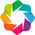

In [18]:
import cartopy.crs as ccrs

import geoviews as gv
import holoviews as hv
import numpy as np

from holoviews import opts, streams
from holoviews.element.tiles import OSM

gv.extension("bokeh","matplotlib")

In [19]:
kdims = ["x", "y", "t"]
vdims = ["var"]

hv.Dimension.type_formatters[np.datetime64] = '%Y-%m-%d-%H:%M'  # readable time format
gv_mndwi = gv.Dataset(da_mndwi, kdims=kdims, vdims=vdims, crs=ccrs.UTM(utm_zone)).redim(x="lon", y="lat")

print(repr(gv_mndwi))

:Dataset   [lon,lat,t]   (var)


In [20]:
dmap_mndwi = gv_mndwi.to(gv.Image, ["lon", "lat"], "var", group="raw_data", label="raw", datatype=["xarray"], dynamic=True)
overlay_mndwi = OSM() * dmap_mndwi
overlay_mndwi.opts(
    opts.Image(cmap="turbo", colorbar=True, clim=(-1, 1), alpha=0.8, height=500, width=500, tools=["hover"]),
    opts.Tiles(height=500, width=500))

overlay_mndwi

:DynamicMap   [t]
   :Overlay
      .Tiles.I      :Tiles   [x,y]
      .Raw_data.Raw :Image   [lon,lat]   (var)

## Get otsu around water edges

The algorithm uses Canny edge detection to detect changes around the water edges in the reservoir. Then we use otsu thresholding to define a correct mndwi threshold for filtering non-water/water pixels around these edges.

In [22]:
from skimage.filters import threshold_otsu
from skimage.feature import canny

non_nan = da_mndwi.ffill("x").bfill("x").ffill("y").bfill("y")
img = non_nan.isel(t=0)

can = canny(img, 0.7, 0.5, 1)

thresh = threshold_otsu(img.values, 100)
print(f"otsu: {thresh}")
can

otsu: -0.025775041431188583


array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [23]:
non_nan.sel(t=non_nan["t"][0])

<xarray.DataArray 'var' (y: 512, x: 512)>
array([[-0.23467863, -0.23467863, -0.23467863, ..., -0.24437855,
        -0.24437855, -0.24437855],
       [-0.2636847 , -0.2636847 , -0.2636847 , ..., -0.20856556,
        -0.20856556, -0.20856556],
       [-0.24177505, -0.24177505, -0.24177505, ..., -0.2593628 ,
        -0.2593628 , -0.2593628 ],
       ...,
       [-0.39180818, -0.39180818, -0.39180818, ..., -0.34402984,
        -0.34402984, -0.34402984],
       [-0.39180818, -0.39180818, -0.39180818, ..., -0.34402984,
        -0.34402984, -0.34402984],
       [-0.39180818, -0.39180818, -0.39180818, ..., -0.34402984,
        -0.34402984, -0.34402984]], dtype=float32)
Coordinates:
    t        object 2021-05-10 00:00:00
  * x        (x) float64 5.906e+05 5.907e+05 5.907e+05 ... 5.957e+05 5.958e+05
  * y        (y) float64 5.494e+06 5.494e+06 5.494e+06 ... 5.489e+06 5.489e+06
Attributes:
    coordinates:   y x
    long_name:     var
    units:         
    _FillValue:    nan
    scale_factor:  1.0
    add_offset:    0.0

In [24]:
%matplotlib inline

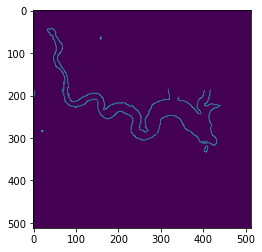

In [25]:
import matplotlib.pyplot as plt

plt.imshow(can)

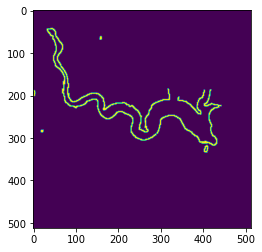

In [26]:
import skimage.morphology

dilated = skimage.morphology.dilation(can, footprint=np.ones([3, 3]))

plt.imshow(dilated)

In [27]:
mndwi_edge = da_mndwi.where(dilated)

In [28]:
kdims = ["x", "y", "t"]
vdims = ["var"]

hv.Dimension.type_formatters[np.datetime64] = '%Y-%m-%d-%H:%M'  # readable time format
gv_edge = gv.Dataset(mndwi_edge, kdims=kdims, vdims=vdims, crs=ccrs.UTM(utm_zone)).redim(x="lon", y="lat")

print(repr(gv_edge))

:Dataset   [lon,lat,t]   (var)


In [29]:
dmap_edge = gv_edge.to(gv.Image, ["lon", "lat"], "var", group="raw_data", label="raw", datatype=["xarray"], dynamic=True)
overlay_edge = OSM() * dmap_edge
overlay_edge.opts(
    opts.Image(cmap="turbo", colorbar=True, clim=(-1, 1), alpha=0.8, height=500, width=500, tools=["hover"]),
    opts.Tiles(height=500, width=500))

overlay_edge

:DynamicMap   [t]
   :Overlay
      .Tiles.I      :Tiles   [x,y]
      .Raw_data.Raw :Image   [lon,lat]   (var)

In [45]:
flat = mndwi_edge.values.ravel()
flat = flat[~np.isnan(flat)]
flat

array([-0.23126511, -0.04512195, -0.13284865, ...,  0.01876676,
        0.0222618 , -0.11489993], dtype=float32)

In [46]:
th = threshold_otsu(flat, 100)
th

0.110481136

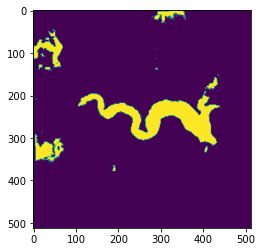

In [47]:
water = da_mndwi > th
plt.imshow(water.isel(t=3))

In [48]:
area = water.isel(t=3).sum() * 10e2 #m2
area.values[()]

20239000.0

## Download Global Water Occurrence dataset

In [49]:
# con.describe_collection("GLOBAL_SURFACE_WATER")

In [56]:
water_occurrence: DataCube = con.load_collection(
    collection_id="GLOBAL_SURFACE_WATER",
    spatial_extent=bbox_openeo,
    bands=["occurrence"]
)

/opt/conda/lib/python3.9/site-packages/openeo/metadata.py:279: UserWarning: Band name mismatch: ['change', 'extent', 'occurrence', 'recurrence', 'seasonality', 'transitions'] != ['change', 'extent', 'occurrence', 'recurrence', 'seasonality', 'transitions', 'dataMask']
  complain("Band name mismatch: {a} != {b}".format(a=cube_dimension_band_names, b=eo_band_names))


In [57]:
job: RESTJob = water_occurrence.send_job("netcdf", "wo", description="wo")
job = job.start_and_wait()

/tmp/ipykernel_62/37549992.py:1: DeprecationWarning: Call to deprecated method `send_job`, use `create_job` instead.
  job: RESTJob = water_occurrence.send_job("netcdf", "wo", description="wo")


0:00:00 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': send 'start'
0:00:25 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:00:31 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:00:37 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:00:46 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:00:56 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:01:08 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:01:24 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:01:44 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': queued (progress N/A)
0:02:08 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': running (progress N/A)
0:02:38 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': running (progress N/A)
0:03:16 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': running (progress N/A)
0:04:03 Job '3e1c45df-ce9c-4cc4-bf00-a12d94a30e61': running (progress N/A)
0:05:02 Job '3e1c45df-ce9c-4cc4-bf00-a12d94

In [58]:
wo_path = out_dir / "wo.nc"
job.get_results().get_assets()[0].download(wo_path)

PosixPath('output/wo.nc')

In [34]:
import rioxarray
import xarray as xr

wo_path = out_dir / "wo.nc"
fixed_wo_path: Path = out_dir / "wo_fixed.nc"
ds_wo: xr.Dataset = rioxarray.open_rasterio(wo_path)
da_wo = ds_wo.drop("crs")
da_wo.to_netcdf(fixed_wo_path)
da_wo

<xarray.DataArray 'occurrence' (t: 2, y: 256, x: 512)>
[262144 values with dtype=int16]
Coordinates:
  * t        (t) object 2019-01-01 00:00:00 2020-01-01 00:00:00
  * x        (x) float64 16.25 16.25 16.25 16.25 ... 16.38 16.38 16.38 16.38
  * y        (y) float64 49.59 49.59 49.59 49.59 ... 49.53 49.53 49.53 49.53
Attributes:
    coordinates:   y x
    long_name:     occurrence
    units:         
    _FillValue:    0.0
    _Unsigned:     true
    scale_factor:  1.0
    add_offset:    0.0

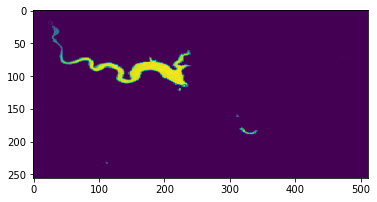

In [35]:
plt.imshow(da_wo.isel(t=1).values)

In [36]:
# reproject onto utm
import rioxarray

da_wo = da_wo.rio.write_crs(4326)
da_wo

<xarray.DataArray 'occurrence' (t: 2, y: 256, x: 512)>
[262144 values with dtype=int16]
Coordinates:
  * t        (t) object 2019-01-01 00:00:00 2020-01-01 00:00:00
  * x        (x) float64 16.25 16.25 16.25 16.25 ... 16.38 16.38 16.38 16.38
  * y        (y) float64 49.59 49.59 49.59 49.59 ... 49.53 49.53 49.53 49.53
    crs      int64 0
Attributes:
    coordinates:   y x
    long_name:     occurrence
    units:         
    _FillValue:    0.0
    _Unsigned:     true
    scale_factor:  1.0
    add_offset:    0.0

new crs: EPSG:32633


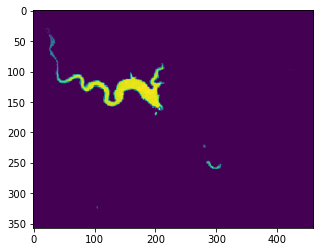

In [37]:
da_wo_utm = da_wo.rio.reproject(da_wo.rio.estimate_utm_crs())
print(f"new crs: {da_wo_utm.rio.crs}")
da_wo_utm
plt.imshow(da_wo_utm.isel(t=1))

In [65]:
da_mndwi.coords.get("x")

<xarray.DataArray 'x' (x: 512)>
array([590645., 590655., 590665., ..., 595735., 595745., 595755.])
Coordinates:
  * x        (x) float64 5.906e+05 5.907e+05 5.907e+05 ... 5.957e+05 5.958e+05
Attributes:
    axis:           X
    long_name:      x coordinate
    standard_name:  projection_x_coordinate
    units:          degrees_east

In [38]:
# Then start resample on mdnwi datacube
da_wo_interp = da_wo_utm.interp(coords={"x": da_mndwi.coords.get("x"), "y": da_mndwi.coords.get("y")}, assume_sorted=False)
da_wo_interp

<xarray.DataArray 'occurrence' (t: 2, y: 512, x: 512)>
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]])
Coordinates:
  * t        (t) object 2019-01-01 00:00:00 2020-01-01 00:00:00
    crs      int64 0
  * x        (x) float64 5.906e+05 5.907e+05 5.907e+05 ... 5.957e+05 5.958e+05
  * y        (y) float64 5.494e+06 5.494e+06 5.494e+06 ... 5.489e+06 5.489e+06
Attributes:
    coordinates:   y x
    long_name:     occurrence
    units:         
    _Unsigned:     true
    scale_factor:  1.0
    add_offset:    0.0
    _FillValue:    0

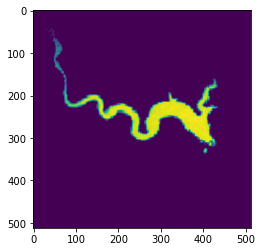

In [39]:
plt.imshow(da_wo_interp.isel(t=1))

In [40]:
wo_edge = da_wo_interp.where(dilated)
wo_flat = wo_edge.values.ravel()
wo_flat = wo_flat[~np.isnan(wo_flat)]
p = np.median(wo_flat)
p

5.3109096336100166

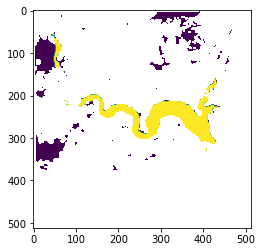

In [54]:
# get correct "water height" and exclude low values of mndwi (we're sure it's land)
water_fill_JRC = da_wo_interp > p
water_fill_JRC = water_fill_JRC.where(da_mndwi.isel(t=3) > -0.15)
plt.imshow(water_fill_JRC.isel(t=1))

array([ 0.,  1., nan])

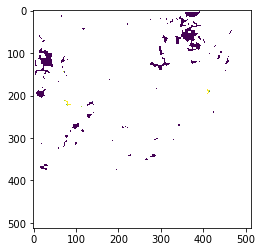

In [55]:
# Now filter where we already have a value for "water"
water_fill = water_fill_JRC.where(~water.isel(t=3))
plt.imshow(water_fill.isel(t=1))
np.unique(water_fill.values)

In [50]:
area_filled = water_fill.where(~np.isnan(water_fill)).isel(t=1).sum() * 10e2  # m2
print(f"area filled: {area_filled.values[()]}")
filled_fraction = area_filled / area
print(f"filled fraction: {filled_fraction.values[()]}")

area filled: 1809000.0
filled fraction: 0.08938188645684075


## Merge JRC Dataset on top of MNDWI cube

As seen in the local example above, we need to have the JRC datacube available in the waterwatch algorithm to fill in the gaps when we have cloudy images. To have access to this images, we need to resample this cube on top of our existing MDNWI cube.

In [ ]:
resampled_jrc: DataCube = water_occurrence.resample_cube_spatial(mndwi, method="near")
merged: DataCube = resampled_jrc.merge_cubes(

In [ ]:
def load_udf(path: Path):
    with open(path, 'r+') as f:
        return f.read()

udf_path: Path = Path.cwd().parent / "udfs" / "otsu_thresholding.py"
otsu_udf = load_udf(udf_path)

In [ ]:
def otsu_thresholding(
    dc: DataCube,
    geometry: BaseGeometry
) -> DataCube:
    process = lambda data: data.run_udf(udf=otsu_udf, runtime="Python")
    return dc.chunk_polygon(chunks=geometry, process=process)

otsu_dc = otsu(dc, shapely_polygon, quality_score_udf)